## 1. Downloading the Dataset

In this step, we download the **LFW (Labeled Faces in the Wild)** dataset along with its **attribute annotations** using `kagglehub`:

- **LFW Dataset**: A large collection of face images used for face recognition and generative tasks.
- **LFW Attributes**: Provides additional information such as gender, age, and other facial attributes, which can be useful for analysis.

We will later use this dataset for encoding and decoding images through the pre-trained VAE model.



In [1]:
import kagglehub

# Download the LFW dataset (Labeled Faces in the Wild)
# This dataset contains thousands of face images for face-related tasks
path_1 = kagglehub.dataset_download("jessicali9530/lfw-dataset")
print("Path to LFW dataset files:", path_1)

# Download LFW attributes dataset
# This dataset provides attribute annotations (e.g., gender, age, smile, etc.) for LFW images
path_2 = kagglehub.dataset_download("averkij/lfw-attributes")
print("Path to LFW attributes files:", path_2)


100%|██████████| 112M/112M [00:06<00:00, 18.5MB/s]

Extracting files...


Path to LFW dataset files: /root/.cache/kagglehub/datasets/jessicali9530/lfw-dataset/versions/4


100%|██████████| 6.49M/6.49M [00:01<00:00, 4.78MB/s]

Extracting files...


Path to LFW attributes files: /root/.cache/kagglehub/datasets/averkij/lfw-attributes/versions/1


## 2. Organizing the Dataset

The datasets downloaded via `kagglehub` are stored in a cache directory by default (`/root/.cache/kagglehub`).  
To simplify access during training and inference, we copy them into the Colab working directory (`/content`):

- **`lfw-dataset`** → Contains the actual face images.  
- **`lfw-attributes`** → Contains attribute labels corresponding to the face images.

This ensures that all subsequent file operations work seamlessly within the `/content` directory.


In [2]:
# Copy the downloaded datasets from the KaggleHub cache to the working directory (Colab /content)
# This step ensures we have easy access to the datasets for later processing.

!cp -r /root/.cache/kagglehub/datasets/jessicali9530/lfw-dataset/versions/4 /content/lfw-dataset
!cp -r /root/.cache/kagglehub/datasets/averkij/lfw-attributes/versions/1 /content/lfw-attributes


## 3. Importing Required Libraries

In this step, we import all necessary libraries for our VAE-based face generation task:

- **Visualization & Utilities**: `matplotlib`, `cv2`, `imageio`, `numpy`, `pandas`, etc., for handling and displaying images.
- **Deep Learning Framework**: `torch` and its submodules for building and running the Variational Autoencoder (VAE).
- **Progress & Debugging**: `tqdm` for progress bars and `pprint` for structured output.
- **Data Handling**: `train_test_split` for splitting datasets into training and testing subsets.

These libraries will help us in data preprocessing, building the VAE model, and visualizing the generated outputs.


In [3]:
# ---------- Visualization and Basic Utilities ----------
import matplotlib.pyplot as plt   # For plotting and visualizing images and results
import os                        # For directory and file path handling
import glob                      # For searching files with patterns
import pandas as pd              # For handling tabular data (e.g., attributes CSV)
import random                    # For random sampling
import numpy as np               # For numerical operations
import cv2                       # OpenCV for image processing
import base64                    # Encoding/decoding images if needed
import imageio                   # For saving and reading images (useful for generated outputs)

# ---------- PyTorch (Deep Learning) ----------
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
from torch.autograd import Variable

# ---------- Miscellaneous ----------
from copy import deepcopy        # For copying objects (useful in training loops)
from tqdm import tqdm            # Progress bar for loops
from pprint import pprint        # Pretty print for debugging
from PIL import Image            # PIL for image reading/writing and transformations
from sklearn.model_selection import train_test_split  # Splitting data into train/test


In [4]:
# Check if GPU (CUDA) is available, otherwise fall back to CPU
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Print the device being used for training or inference
print('Training on', DEVICE)


Training on cuda


## 5. Preparing the Dataset

In this step, we process the **LFW dataset** to organize image paths and filter out excessive samples:

1. **Path Setup**  
   - `DATASET_PATH`: Points to the folder containing face images.  
   - `ATTRIBUTES_PATH`: Points to the attributes file (used later if needed).

2. **Building the Dataset**  
   - We iterate through all `.jpg` images using `glob`.  
   - For each image, we extract:
     - **Person Name** (from folder name)
     - **Image Path**

3. **Filtering**  
   - We keep only persons with **fewer than 25 images** to reduce imbalance and make training manageable.

4. **Result**  
   - The dataset is converted into a pandas DataFrame and the first 10 rows are displayed.


In [5]:
# Define dataset and attributes file paths
DATASET_PATH = "/content/lfw-dataset/lfw-deepfunneled/lfw-deepfunneled"
ATTRIBUTES_PATH = "/content/lfw-attributes/lfw_attributes.txt"

dataset = []

# Loop through all .jpg images in the dataset directory (recursively)
for path in glob.iglob(os.path.join(DATASET_PATH, "**", "*.jpg")):
    person = path.split("/")[-2]  # Extract person name (folder name)
    dataset.append({"person": person, "path": path})  # Store as dictionary

# Convert to pandas DataFrame for easier handling
dataset = pd.DataFrame(dataset)

# Filter out persons having 25 or more images to keep dataset balanced/simpler
dataset = dataset.groupby("person").filter(lambda x: len(x) < 25)

# Display the first 10 rows
dataset.head(10)


,person,path
0,Mel_Gibson,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
1,Mel_Gibson,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
2,Mark_McClellan,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
3,Roel_Campos,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
4,Michael_Rolinee,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
5,Steve_Phillips,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
6,Art_Cooper,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
7,Trent_Lott,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
8,Trent_Lott,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...
9,Trent_Lott,/content/lfw-dataset/lfw-deepfunneled/lfw-deep...


## 6. Visualizing Random Sample Images

To get an overview of the dataset quality, we randomly display **20 images**:

- **Purpose**:  
  - Check if the images are properly loaded and clear.
  - Visually confirm that the dataset contains diverse individuals.

- **Plot Details**:  
  - The figure is organized in a **4x5 grid**.
  - Each image title shows the corresponding person's name.
  - Axis ticks are removed for clarity.


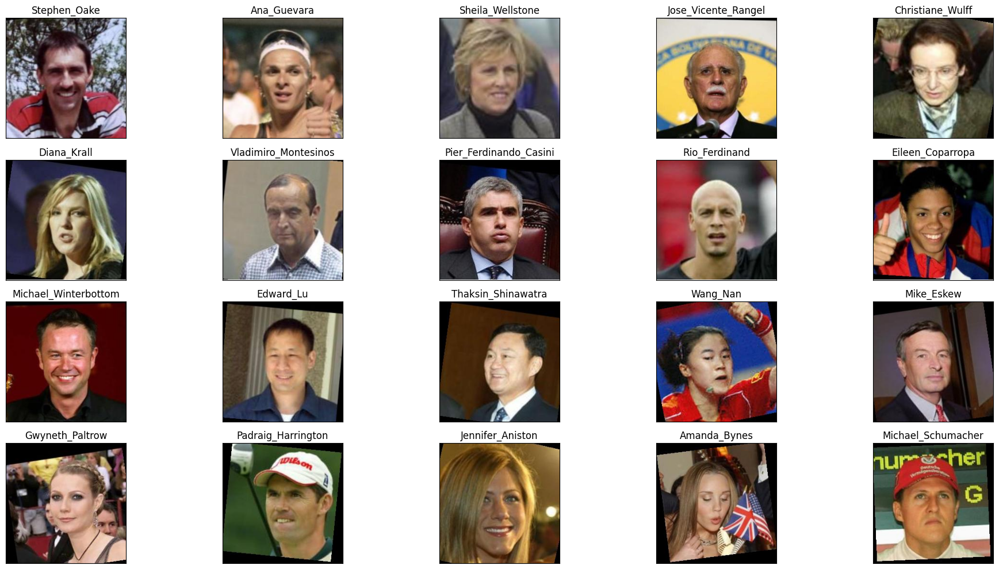

In [6]:
plt.figure(figsize=(20, 10))  # Set the overall figure size

# Display 20 random sample images from the dataset
for i in range(20):
    idx = random.randint(0, len(dataset) - 1)  # Pick a random index
    img = plt.imread(dataset.path.iloc[idx])  # Read the image

    # Create a subplot (4 rows x 5 columns)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img)
    plt.title(dataset.person.iloc[idx])  # Display the person's name as the title
    plt.xticks([])  # Remove x-axis ticks
    plt.yticks([])  # Remove y-axis ticks

plt.tight_layout()  # Adjust layout to avoid overlap
plt.show()          # Show the plot


## 7. Defining a Dataset Preprocessing Function

We define a helper function `fetch_dataset()` to load and preprocess the **LFW dataset**:

### **Steps:**
1. **Load Attributes**  
   - Read the `lfw_attributes.txt` file and store all facial attributes (gender, smiling, etc.).

2. **Collect Image Paths**  
   - Extract **person name** and **image number** from file names.
   - Combine this information into a DataFrame.

3. **Merge Attributes with Images**  
   - Ensure that each image is paired with its corresponding attributes.

4. **Preprocess Images**  
   - **Cropping**: Remove unnecessary borders (`dx`, `dy`) to center the faces.  
   - **Resizing**: Scale images to `(dimx, dimy)` → smaller size speeds up training.

5. **Return**  
   - `all_photos`: Numpy array of processed images.  
   - `all_attrs`: DataFrame of corresponding facial attributes.

This function ensures we have a clean, standardized dataset ready for VAE training or inference.


In [7]:
def fetch_dataset(dx=80, dy=80, dimx=45, dimy=45):
    """
    Fetch and preprocess the LFW dataset along with its attributes.

    Parameters:
    -----------
    dx, dy : int
        Pixels to crop from left/right (dx) and top/bottom (dy) for centering faces.
    dimx, dimy : int
        Final resized image dimensions.

    Returns:
    --------
    all_photos : numpy array
        Preprocessed images as numpy array of shape (N, dimy, dimx, 3).
    all_attrs : pandas DataFrame
        Corresponding attributes for each image (e.g., gender, smiling).
    """

    # Load attributes file (tab-separated, skip first row of meta info)
    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1)
    df_attrs = pd.DataFrame(df_attrs.iloc[:, :-1].values, columns=df_attrs.columns[1:])

    # Collect image file paths and match them to person names and image numbers
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath, fname)

                # Extract person name and image number from file name
                photo_id = fname[:-4].replace('_', ' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])

                photo_ids.append({
                    'person': person_id,
                    'imagenum': photo_number,
                    'photo_path': fpath
                })

    photo_ids = pd.DataFrame(photo_ids)

    # Merge attributes with photo paths
    df = pd.merge(df_attrs, photo_ids, on=('person', 'imagenum'))
    assert len(df) == len(df_attrs), "Lost some data when merging dataframes"

    # Preprocess images:
    # 1. Crop borders (dx, dy)
    # 2. Resize to target dimensions
    all_photos = (
        df['photo_path']
        .apply(imageio.imread)
        .apply(lambda img: img[dy:-dy, dx:-dx])  # Crop
        .apply(lambda img: np.array(Image.fromarray(img).resize([dimx, dimy])))  # Resize
    )

    all_photos = np.stack(all_photos.values).astype('uint8')

    # Remove unnecessary columns, keep only attributes
    all_attrs = df.drop(["photo_path", "person", "imagenum"], axis=1)

    return all_photos, all_attrs


## 8. Preparing the Data for the VAE

Before passing the images into the Variational Autoencoder (VAE), we perform the following preprocessing steps:

1. **Image Dimensions**  
   - Extract height (`IMAGE_H = 45`) and width (`IMAGE_W = 45`).

2. **Normalization**  
   - Scale pixel values from `[0, 255]` to `[0, 1]` for faster convergence and stable training.

3. **Train/Validation Split**  
   - Split the dataset into **80% training** and **20% validation** using `train_test_split`.

4. **Tensor Conversion**  
   - Convert NumPy arrays into PyTorch `FloatTensor` format (required for model training).

5. **Latent Space Dimension**  
   - Define `dim_z = 100`, which determines the size of the latent representation (z-vector).

Finally, we check the shape of `X_train` to confirm the data structure.


In [8]:
data, attrs = fetch_dataset()

In [9]:
# Extract image dimensions (height and width) from the dataset
IMAGE_H = data.shape[1]  # Height = 45
IMAGE_W = data.shape[2]  # Width  = 45

# Set the number of channels (RGB images)
N_CHANNELS = 3

# Normalize pixel values to range [0, 1] for better training stability
data = np.array(data / 255, dtype='float32')

# Split the dataset into training and validation sets (80% train, 20% validation)
X_train, X_val = train_test_split(data, test_size=0.2, random_state=42)

# Convert to PyTorch FloatTensor format for use in the VAE model
X_train = torch.FloatTensor(X_train)
X_val = torch.FloatTensor(X_val)

# Set the latent space dimension (size of z vector in VAE)
dim_z = 100

# Check the shape of the training data
X_train.shape


torch.Size([10514, 45, 45, 3])

In [10]:
attrs.head()
attrs.columns

Index(['Male', 'Asian', 'White', 'Black', 'Baby', 'Child', 'Youth',
       'Middle Aged', 'Senior', 'Black Hair', 'Blond Hair', 'Brown Hair',
       'Bald', 'No Eyewear', 'Eyeglasses', 'Sunglasses', 'Mustache', 'Smiling',
       'Frowning', 'Chubby', 'Blurry', 'Harsh Lighting', 'Flash',
       'Soft Lighting', 'Outdoor', 'Curly Hair', 'Wavy Hair', 'Straight Hair',
       'Receding Hairline', 'Bangs', 'Sideburns', 'Fully Visible Forehead',
       'Partially Visible Forehead', 'Obstructed Forehead', 'Bushy Eyebrows',
       'Arched Eyebrows', 'Narrow Eyes', 'Eyes Open', 'Big Nose',
       'Pointy Nose', 'Big Lips', 'Mouth Closed', 'Mouth Slightly Open',
       'Mouth Wide Open', 'Teeth Not Visible', 'No Beard', 'Goatee',
       'Round Jaw', 'Double Chin', 'Wearing Hat', 'Oval Face', 'Square Face',
       'Round Face', 'Color Photo', 'Posed Photo', 'Attractive Man',
       'Attractive Woman', 'Indian', 'Gray Hair', 'Bags Under Eyes',
       'Heavy Makeup', 'Rosy Cheeks', 'Shiny Skin', 'Pa

## 9. Defining the Variational Autoencoder (VAE)

This is the core model used for **generating new, diverse facial images**.

### **Architecture**

1. **Encoder (Image → Latent Space)**  
   - Compresses the flattened image (`45×45×3 = 6075 pixels`) into a latent distribution.  
   - Outputs two vectors:  
     - **μ (mu)** – mean of the latent distribution.  
     - **log(σ²) (logvar)** – log variance of the latent distribution.

2. **Reparameterization Trick**  
   - Samples a latent vector `z` using:
     \[
     z = \mu + \sigma \cdot \epsilon \quad (\epsilon \sim \mathcal{N}(0,1))
     \]
   - Allows gradients to propagate through the stochastic layer.

3. **Decoder (Latent Space → Reconstructed Image)**  
   - Expands the latent vector back to reconstruct an image (`45×45×3`).

### **Loss Function**

The VAE minimizes a combination of:
- **Binary Cross Entropy (BCE)** → Ensures reconstructed images are similar to input.  
- **KL Divergence (KLD)** → Regularizes the latent space to approximate a standard normal distribution.

This structure enables the generation of **new, unseen images** by sampling from the latent space.


In [11]:
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()

        # -------- Encoder: Image → Latent Space (mu & logvar) --------
        self.fc1 = nn.Linear(45 * 45 * 3, 1500)  # Flatten image and compress to 1500 features
        self.fc21 = nn.Linear(1500, dim_z)       # Mean vector (mu)
        self.fc22 = nn.Linear(1500, dim_z)       # Log-variance vector (logvar)

        # -------- Decoder: Latent Space → Reconstructed Image --------
        self.fc3 = nn.Linear(dim_z, 1500)        # Expand latent vector back to 1500 features
        self.fc4 = nn.Linear(1500, 45 * 45 * 3)  # Reconstruct image to original size

        self.relu = nn.LeakyReLU()  # Activation function

    def encode(self, x):
        """
        Encode input image into latent distribution parameters: mu & logvar.
        """
        x = self.relu(self.fc1(x))
        return self.fc21(x), self.fc22(x)

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick:
        z = mu + std * epsilon  (epsilon ~ Normal(0,1))
        Ensures gradients can flow through the stochastic sampling process.
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return eps.mul(std).add_(mu)

    def decode(self, z):
        """
        Decode latent vector back into reconstructed image.
        """
        z = self.relu(self.fc3(z))
        return torch.sigmoid(self.fc4(z))  # Sigmoid to normalize pixels [0,1]

    def forward(self, x):
        """
        Full VAE forward pass: Encode → Reparameterize → Decode.
        Returns reconstructed image, mean, and log variance.
        """
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        z = self.decode(z)
        return z, mu, logvar


# -------- Loss Function: VAE Total Loss = BCE + KL Divergence --------
def loss_vae_fn(x, recon_x, mu, logvar):
    """
    Compute VAE Loss:
    1) Reconstruction Loss (BCE): Measures similarity between input & reconstructed image.
    2) KL Divergence (KLD): Regularizes latent space to follow N(0,1) distribution.
    """
    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE + KLD


## 10. Initializing the VAE Model

We now initialize the **Variational Autoencoder (VAE)**:

- **`VAE()`**: Creates an instance of the defined model architecture.  
- **`.to(DEVICE)`**: Moves the model to the appropriate computing device:
  - **GPU (CUDA)** if available → faster training and inference.
  - **CPU** otherwise.

The model is now ready to be trained on the face dataset.


In [12]:
# Initialize the VAE model and move it to the selected device (GPU if available, otherwise CPU)
model_vae = VAE().to(DEVICE)

## 11. Training and Evaluation Functions for VAE

We define helper functions to train and evaluate the **Variational Autoencoder (VAE):**

### **1) `fit_epoch_vae()`**
- Runs **one training epoch**:
  - Flattens input images (`45×45×3 → 6075`).
  - Performs forward pass, computes **VAE loss (BCE + KLD)**, backpropagation, and optimizer updates.
  - Returns average training loss.

### **2) `eval_epoch_vae()`**
- Evaluates the model on the **validation set**:
  - Disables gradient updates (`torch.set_grad_enabled(False)`).
  - Computes validation loss.
  - **Visual Check**: Reconstructs and displays a sample image for quality inspection.

### **3) `train_vae()`**
- Complete training loop for a given number of epochs.
- Logs and stores `train_loss` & `val_loss` for each epoch.
- Returns a `history` list for plotting learning curves.

These functions are essential for monitoring the VAE’s performance and ensuring it learns a meaningful latent representation for generating new images.


In [13]:
def fit_epoch_vae(model, train_x, optimizer, batch_size, is_cnn=False):
    """
    Perform one training epoch for the VAE.

    Args:
        model       : VAE model.
        train_x     : Training data (tensor).
        optimizer   : Optimizer (Adam).
        batch_size  : Batch size for training.

    Returns:
        train_loss  : Average training loss for the epoch.
    """
    running_loss = 0.0
    processed_data = 0

    for inputs in get_batch(train_x, batch_size):
        inputs = inputs.view(-1, 45 * 45 * 3).to(DEVICE)  # Flatten images
        optimizer.zero_grad()

        decoded, mu, logvar = model(inputs)  # Forward pass
        outputs = decoded.view(-1, 45 * 45 * 3).to(DEVICE)

        loss = loss_vae_fn(inputs, outputs, mu, logvar)  # Compute VAE loss
        loss.backward()          # Backpropagation
        optimizer.step()         # Update weights

        running_loss += loss.item() * inputs.shape[0]
        processed_data += inputs.shape[0]

    train_loss = running_loss / processed_data
    return train_loss


def eval_epoch_vae(model, x_val, batch_size):
    """
    Evaluate the VAE model on the validation set.

    Args:
        model      : VAE model.
        x_val      : Validation data.
        batch_size : Batch size.

    Returns:
        val_loss   : Average validation loss.
    """
    running_loss = 0.0
    processed_data = 0
    model.eval()  # Switch to evaluation mode (disables dropout, etc.)

    for inputs in get_batch(x_val, batch_size=batch_size):
        inputs = inputs.view(-1, 45 * 45 * 3).to(DEVICE)

        with torch.set_grad_enabled(False):
            decoded, mu, logvar = model(inputs)
            outputs = decoded.view(-1, 45 * 45 * 3)
            loss = loss_vae_fn(inputs, outputs, mu, logvar)

            running_loss += loss.item() * inputs.shape[0]
            processed_data += inputs.shape[0]

    val_loss = running_loss / processed_data

    # ---- Visual Check: Reconstruct a Sample Image ----
    with torch.set_grad_enabled(False):
        pic = x_val[3]
        pic_input = pic.view(-1, 45 * 45 * 3).to(DEVICE)
        decoded, mu, logvar = model(inputs)
        pic_output = decoded[0].view(-1, 45 * 45 * 3).squeeze().to("cpu")
        pic_input = pic_input.to("cpu")

        plot_gallery([pic_input, pic_output], 45, 45, 1, 2)

    return val_loss


def train_vae(train_x, val_x, model, epochs=10, batch_size=32, lr=0.001):
    """
    Complete VAE Training Loop.

    Args:
        train_x    : Training data.
        val_x      : Validation data.
        model      : VAE model.
        epochs     : Number of training epochs.
        batch_size : Batch size.
        lr         : Learning rate.

    Returns:
        history    : List of (train_loss, val_loss) for each epoch.
    """
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    history = []
    log_template = "\nEpoch {ep:03d} train_loss: {t_loss:0.4f} val_loss: {val_loss:0.4f}"

    with tqdm(desc="epoch", total=epochs) as pbar_outer:
        for epoch in range(epochs):
            train_loss = fit_epoch_vae(model, train_x, optimizer, batch_size)
            val_loss = eval_epoch_vae(model, val_x, batch_size)
            print("loss: ", train_loss)

            history.append((train_loss, val_loss))
            pbar_outer.update(1)
            tqdm.write(log_template.format(ep=epoch + 1, t_loss=train_loss, val_loss=val_loss))

    return history


In [14]:
def get_batch(data, batch_size=32):
    """
    Generator that yields mini-batches from a dataset.

    Args:
        data       : Torch Tensor or NumPy array of shape [N, H, W, C] or [N, features].
        batch_size : Size of each mini-batch.

    Yields:
        batch      : A mini-batch of the dataset.
    """
    # Convert to Torch Tensor if NumPy
    if isinstance(data, np.ndarray):
        data = torch.FloatTensor(data)

    for i in range(0, len(data), batch_size):
        yield data[i:i + batch_size]


In [15]:
def plot_gallery(images, h, w, n_row=1, n_col=None, with_title=False, titles=[]):
    if n_col is None:
        n_col = len(images)
    plt.figure(figsize=(1.5 * n_col, 1.7 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        try:
            plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=0, vmax=1)
            if with_title:
                plt.title(titles[i] if i < len(titles) else "")
            plt.xticks(())
            plt.yticks(())
        except:
            pass
    plt.show()
    plt.close()


## 12. Training the VAE Model

We now train the **Variational Autoencoder** using the previously defined `train_vae()` function.

### **Training Setup**
- **Epochs**: 50  
- **Batch Size**: 128  
- **Learning Rate**: 0.001 (Adam optimizer)

### **Output**
- Prints training and validation loss after each epoch.
- Stores results in `history_vae`, which will be later used for **plotting learning curves** to check for overfitting or underfitting.


epoch:   0%|          | 0/50 [00:00<?, ?it/s]

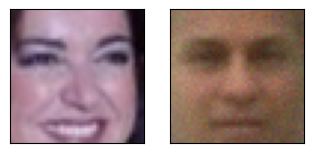

epoch:   2%|▏         | 1/50 [00:01<01:22,  1.68s/it]

loss:  507009.70845717617

Epoch 001 train_loss: 507009.7085 val_loss: 493035.3788


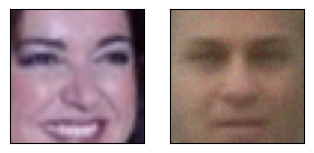

epoch:   4%|▍         | 2/50 [00:02<00:58,  1.22s/it]

loss:  493628.4142021947

Epoch 002 train_loss: 493628.4142 val_loss: 486280.6843


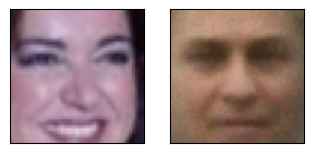

epoch:   6%|▌         | 3/50 [00:03<00:50,  1.08s/it]

loss:  490686.70811536995

Epoch 003 train_loss: 490686.7081 val_loss: 485036.4936


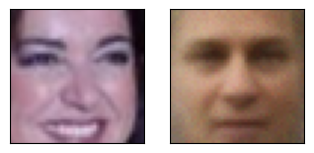

epoch:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

loss:  488400.8718048554

Epoch 004 train_loss: 488400.8718 val_loss: 482489.7564


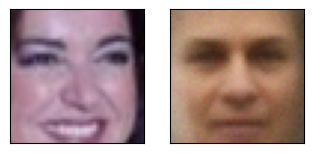

epoch:  10%|█         | 5/50 [00:05<00:43,  1.03it/s]

loss:  486995.9318661428

Epoch 005 train_loss: 486995.9319 val_loss: 481413.3763


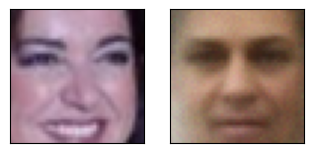

epoch:  12%|█▏        | 6/50 [00:06<00:41,  1.06it/s]

loss:  485914.4942041564

Epoch 006 train_loss: 485914.4942 val_loss: 480455.8734


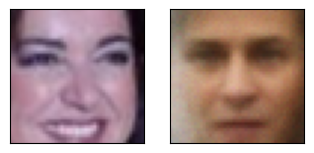

epoch:  14%|█▍        | 7/50 [00:07<00:40,  1.05it/s]

loss:  484780.72218440886

Epoch 007 train_loss: 484780.7222 val_loss: 481883.9812


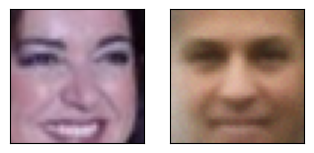

epoch:  16%|█▌        | 8/50 [00:08<00:40,  1.05it/s]

loss:  484149.54637269356

Epoch 008 train_loss: 484149.5464 val_loss: 480016.3605


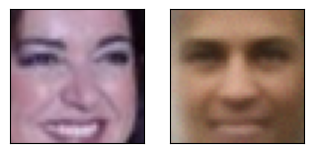

epoch:  18%|█▊        | 9/50 [00:09<00:39,  1.04it/s]

loss:  483335.76236743864

Epoch 009 train_loss: 483335.7624 val_loss: 478197.9680


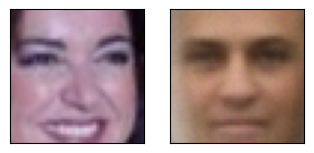

epoch:  20%|██        | 10/50 [00:10<00:39,  1.00it/s]

loss:  483130.4300634868

Epoch 010 train_loss: 483130.4301 val_loss: 477905.4412


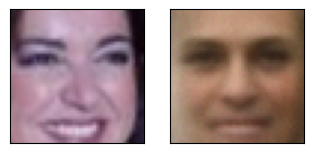

epoch:  22%|██▏       | 11/50 [00:11<00:37,  1.03it/s]

loss:  482525.75269581034

Epoch 011 train_loss: 482525.7527 val_loss: 478515.1809


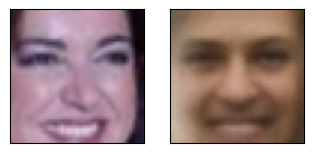

epoch:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

loss:  482087.58681727934

Epoch 012 train_loss: 482087.5868 val_loss: 476958.3259


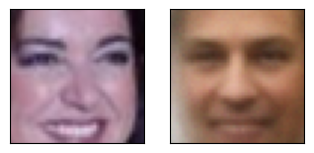

epoch:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

loss:  482441.6757953681

Epoch 013 train_loss: 482441.6758 val_loss: 476771.3766


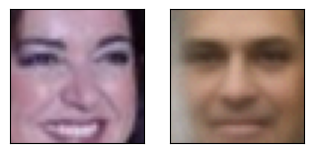

epoch:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

loss:  481704.24371819716

Epoch 014 train_loss: 481704.2437 val_loss: 477684.6709


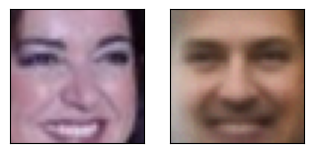

epoch:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

loss:  481109.08833905985

Epoch 015 train_loss: 481109.0883 val_loss: 476594.5166


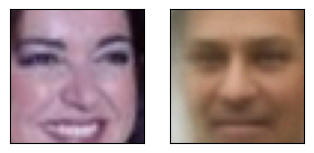

epoch:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

loss:  480801.0159133061

Epoch 016 train_loss: 480801.0159 val_loss: 477917.9002


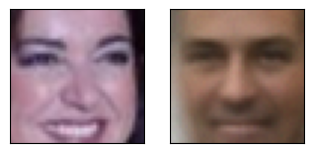

epoch:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

loss:  480943.38809117605

Epoch 017 train_loss: 480943.3881 val_loss: 476291.2613


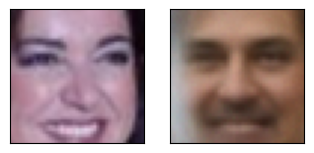

epoch:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

loss:  480690.82914596016

Epoch 018 train_loss: 480690.8291 val_loss: 476062.5626


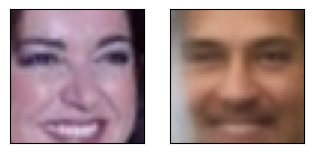

epoch:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

loss:  480202.02899407933

Epoch 019 train_loss: 480202.0290 val_loss: 475715.0531


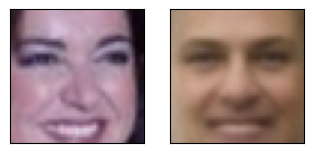

epoch:  40%|████      | 20/50 [00:19<00:27,  1.08it/s]

loss:  479867.42034578894

Epoch 020 train_loss: 479867.4203 val_loss: 475205.9413


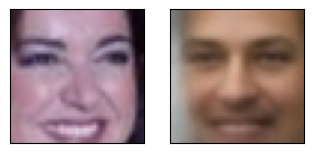

epoch:  42%|████▏     | 21/50 [00:20<00:27,  1.07it/s]

loss:  480056.4830018309

Epoch 021 train_loss: 480056.4830 val_loss: 475099.0600


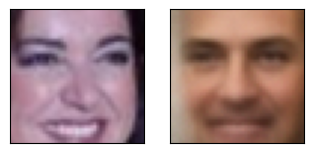

epoch:  44%|████▍     | 22/50 [00:21<00:27,  1.04it/s]

loss:  479584.489861732

Epoch 022 train_loss: 479584.4899 val_loss: 476137.2619


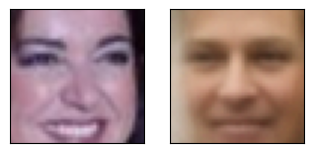

epoch:  46%|████▌     | 23/50 [00:22<00:27,  1.01s/it]

loss:  479559.99718530057

Epoch 023 train_loss: 479559.9972 val_loss: 477381.1417


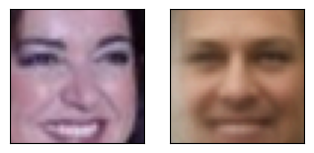

epoch:  48%|████▊     | 24/50 [00:24<00:30,  1.18s/it]

loss:  479621.05077307636

Epoch 024 train_loss: 479621.0508 val_loss: 475017.0531


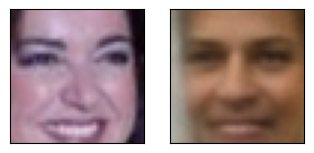

epoch:  50%|█████     | 25/50 [00:25<00:29,  1.16s/it]

loss:  479220.4206653034

Epoch 025 train_loss: 479220.4207 val_loss: 475168.8576


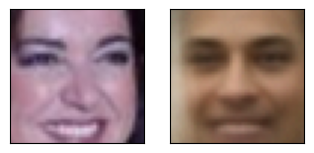

epoch:  52%|█████▏    | 26/50 [00:26<00:26,  1.09s/it]

loss:  478987.60199050076

Epoch 026 train_loss: 478987.6020 val_loss: 475190.8971


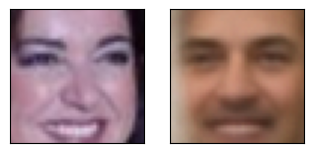

epoch:  54%|█████▍    | 27/50 [00:26<00:23,  1.04s/it]

loss:  479094.1776440936

Epoch 027 train_loss: 479094.1776 val_loss: 474311.3814


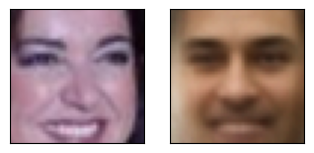

epoch:  56%|█████▌    | 28/50 [00:27<00:22,  1.00s/it]

loss:  478950.79494751047

Epoch 028 train_loss: 478950.7949 val_loss: 476134.0975


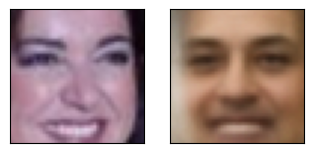

epoch:  58%|█████▊    | 29/50 [00:28<00:20,  1.02it/s]

loss:  478947.83234110475

Epoch 029 train_loss: 478947.8323 val_loss: 474959.5345


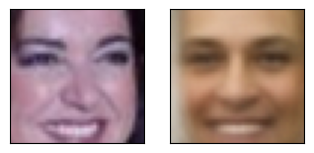

epoch:  60%|██████    | 30/50 [00:29<00:19,  1.04it/s]

loss:  478754.3320929237

Epoch 030 train_loss: 478754.3321 val_loss: 476900.2610


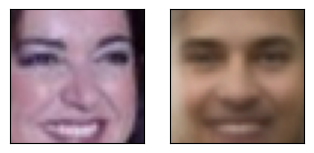

epoch:  62%|██████▏   | 31/50 [00:30<00:18,  1.06it/s]

loss:  478655.08952943695

Epoch 031 train_loss: 478655.0895 val_loss: 476181.1338


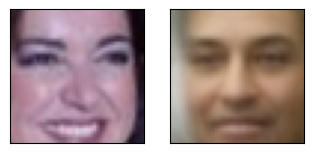

epoch:  64%|██████▍   | 32/50 [00:31<00:16,  1.06it/s]

loss:  478690.12371896993

Epoch 032 train_loss: 478690.1237 val_loss: 475045.5602


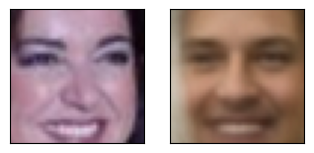

epoch:  66%|██████▌   | 33/50 [00:32<00:16,  1.05it/s]

loss:  478433.0200551051

Epoch 033 train_loss: 478433.0201 val_loss: 474010.7453


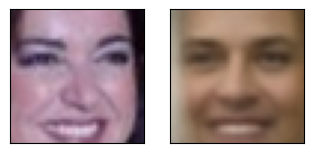

epoch:  68%|██████▊   | 34/50 [00:33<00:15,  1.02it/s]

loss:  478171.253370506

Epoch 034 train_loss: 478171.2534 val_loss: 473766.7831


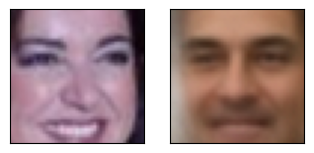

epoch:  70%|███████   | 35/50 [00:34<00:14,  1.03it/s]

loss:  478115.24110115087

Epoch 035 train_loss: 478115.2411 val_loss: 474034.1196


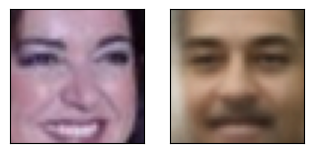

epoch:  72%|███████▏  | 36/50 [00:35<00:13,  1.04it/s]

loss:  478082.85049547034

Epoch 036 train_loss: 478082.8505 val_loss: 473353.2624


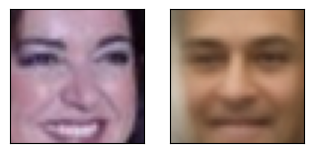

epoch:  74%|███████▍  | 37/50 [00:36<00:12,  1.06it/s]

loss:  477839.7128293228

Epoch 037 train_loss: 477839.7128 val_loss: 474386.8746


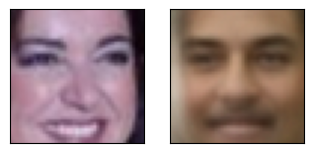

epoch:  76%|███████▌  | 38/50 [00:37<00:11,  1.07it/s]

loss:  477892.2861303976

Epoch 038 train_loss: 477892.2861 val_loss: 474768.1288


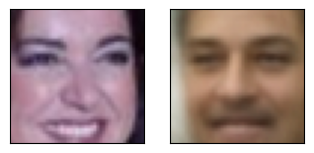

epoch:  78%|███████▊  | 39/50 [00:38<00:10,  1.07it/s]

loss:  477931.8457993509

Epoch 039 train_loss: 477931.8458 val_loss: 473236.3822


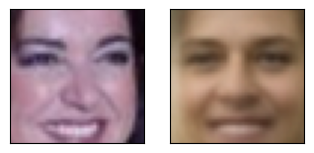

epoch:  80%|████████  | 40/50 [00:39<00:09,  1.07it/s]

loss:  477658.42276518216

Epoch 040 train_loss: 477658.4228 val_loss: 476719.6840


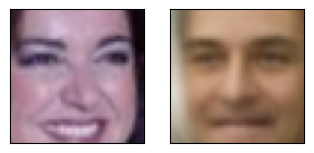

epoch:  82%|████████▏ | 41/50 [00:40<00:08,  1.08it/s]

loss:  478538.57927525206

Epoch 041 train_loss: 478538.5793 val_loss: 475940.5845


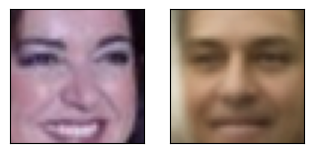

epoch:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

loss:  477958.8881848012

Epoch 042 train_loss: 477958.8882 val_loss: 473763.5180


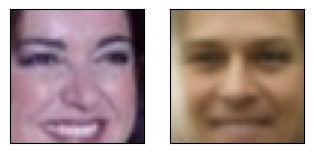

epoch:  86%|████████▌ | 43/50 [00:41<00:06,  1.08it/s]

loss:  477554.47554302594

Epoch 043 train_loss: 477554.4755 val_loss: 473601.3055


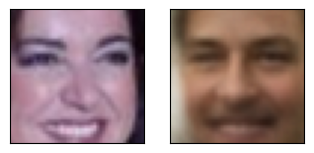

epoch:  88%|████████▊ | 44/50 [00:42<00:05,  1.08it/s]

loss:  477564.51493692934

Epoch 044 train_loss: 477564.5149 val_loss: 474354.0801


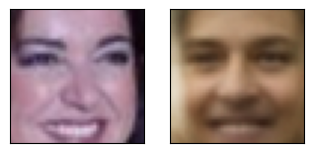

epoch:  90%|█████████ | 45/50 [00:43<00:04,  1.09it/s]

loss:  477682.3220869198

Epoch 045 train_loss: 477682.3221 val_loss: 473745.1653


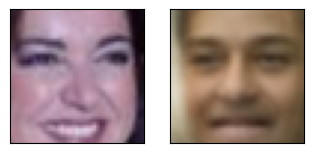

epoch:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

loss:  477544.88804807875

Epoch 046 train_loss: 477544.8880 val_loss: 473027.2190


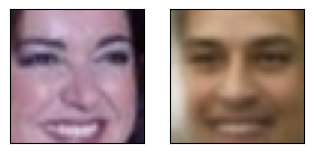

epoch:  94%|█████████▍| 47/50 [00:45<00:02,  1.04it/s]

loss:  477592.85792901134

Epoch 047 train_loss: 477592.8579 val_loss: 473131.8958


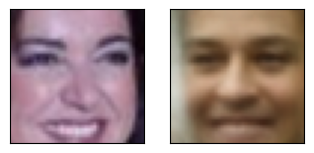

epoch:  96%|█████████▌| 48/50 [00:46<00:01,  1.01it/s]

loss:  477383.446239835

Epoch 048 train_loss: 477383.4462 val_loss: 473138.5598


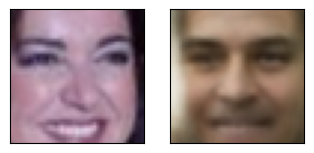

epoch:  98%|█████████▊| 49/50 [00:47<00:00,  1.03it/s]

loss:  477268.673821809

Epoch 049 train_loss: 477268.6738 val_loss: 473337.9995


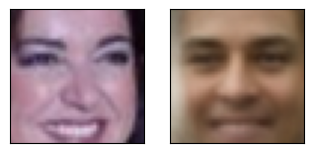

epoch: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]

loss:  477479.9120562464

Epoch 050 train_loss: 477479.9121 val_loss: 473253.4928


In [16]:
# Train the VAE model for 50 epochs using the defined training loop
history_vae = train_vae(
    X_train,        # Training dataset
    X_val,          # Validation dataset
    model_vae,      # VAE model instance
    epochs=50,      # Number of training epochs
    batch_size=128, # Mini-batch size
    lr=0.001        # Learning rate (Adam optimizer)
)


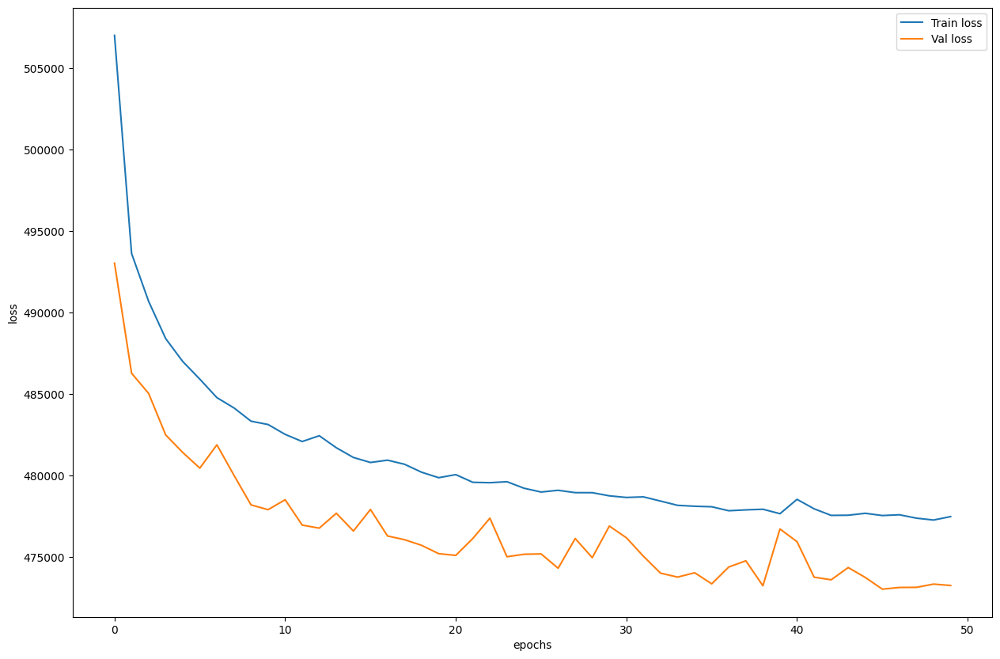

In [17]:
train_loss, val_loss = zip(*history_vae)
plt.figure(figsize=(15,10))
plt.plot(train_loss, label='Train loss')
plt.plot(val_loss, label='Val loss')
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.plot();

## 13. Generating New Faces from the Latent Space

To demonstrate the **generative power** of the VAE:

1. **Sample Random Latent Vectors**
   - We randomly sample `z` from a standard normal distribution `N(0,1)`.

2. **Decode to Images**
   - The sampled latent vectors are passed through the **VAE decoder** to generate new faces.

3. **Visualization**
   - The generated images are reshaped back to `45×45×3` and displayed in a 5×5 grid.

This step showcases the VAE’s ability to produce **diverse, realistic, and thematically consistent facial images**, even if they don’t match any real identity.


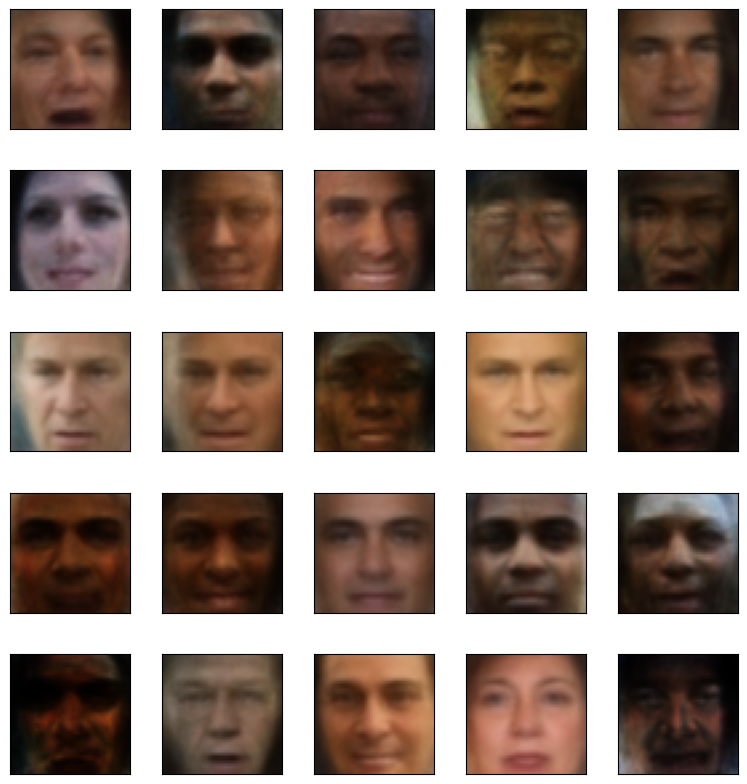

In [18]:
# Sample random points from the latent space (z ~ N(0,1))
z = np.random.randn(25, dim_z)  # 25 generated faces
inputs = torch.FloatTensor(z).to(DEVICE)

# Generate new images using the VAE decoder
with torch.no_grad():
    output = model_vae.decode(inputs)  # Decode latent vectors to images
    imgs = output.cpu().numpy().reshape(-1, 45, 45, 3)  # Reshape to [B, H, W, C]
    plot_gallery(imgs, 45, 45, n_row=5, n_col=5)


## 14. Filtering Images Based on Facial Attributes

Using the provided **attributes dataset (`attrs`)**, we select specific subsets of images to analyze or generate:

1. **Smiling Faces**  
   - Select 25 faces with high smiling scores, skipping the top 100 extreme cases for diversity.

2. **Non-Smiling Faces**  
   - Select 25 faces with the lowest smiling scores.

3. **Eyeglasses**  
   - Select 25 faces most likely wearing eyeglasses.

4. **Sunglasses**  
   - Select 25 faces most likely wearing sunglasses.

These subsets can be used to test how well the VAE captures and reproduces specific facial attributes during generation.


In [19]:
# -------- Filter Faces Based on Attributes --------

# 1) Smiling Faces (Top 25 smiling faces after skipping the first 100 extreme ones)
smile_ids = attrs['Smiling'].sort_values(ascending=False).iloc[100:125].index.values
smile_data = data[smile_ids]

# 2) Non-Smiling Faces (25 faces with the lowest smiling scores)
no_smile_ids = attrs['Smiling'].sort_values(ascending=True).head(25).index.values
no_smile_data = data[no_smile_ids]

# 3) Eyeglasses (Top 25 faces wearing eyeglasses)
eyeglasses_ids = attrs['Eyeglasses'].sort_values(ascending=False).head(25).index.values
eyeglasses_data = data[eyeglasses_ids]

# 4) Sunglasses (Top 25 faces wearing sunglasses)
sunglasses_ids = attrs['Sunglasses'].sort_values(ascending=False).head(25).index.values
sunglasses_data = data[sunglasses_ids]


## 15. Visualizing Filtered Subsets of Faces

We display the selected subsets of images in a **5×5 grid** for each attribute:

1. **Smiling Faces**  
   - Top 25 faces with high smiling scores.

2. **Non-Smiling Faces**  
   - 25 faces with the lowest smiling scores.

3. **Eyeglasses**  
   - Top 25 faces most likely wearing eyeglasses.

4. **Sunglasses**  
   - Top 25 faces most likely wearing sunglasses.

Each grid helps visually inspect whether the attribute-based filtering is correct and whether the VAE can later learn these attributes effectively.


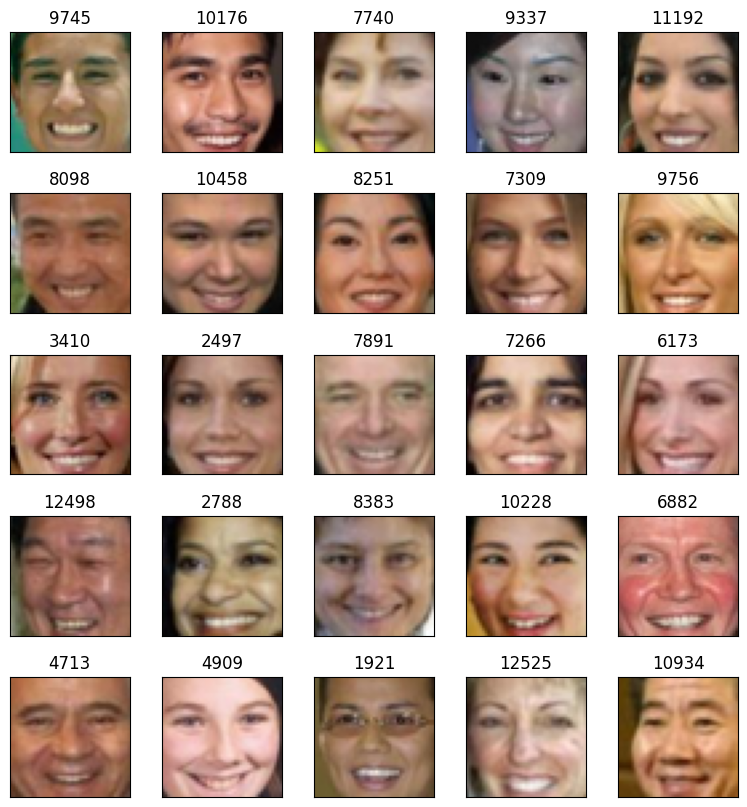

In [20]:
# -------- Visualizing Filtered Images --------

# Display 25 smiling faces
plot_gallery(
    smile_data, IMAGE_H, IMAGE_W,
    n_row=5, n_col=5,
    with_title=True, titles=smile_ids
)



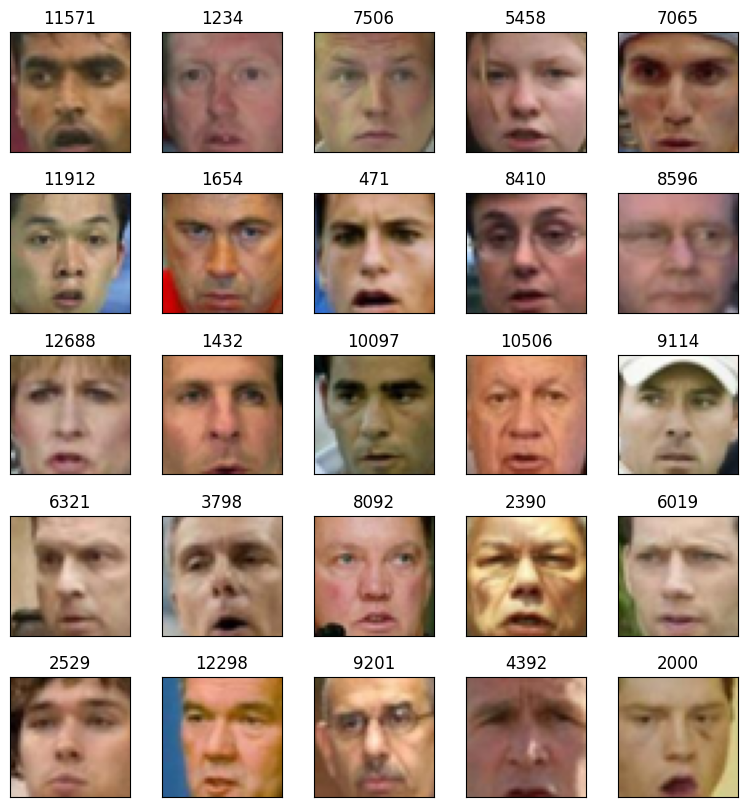

In [21]:
# Display 25 non-smiling faces
plot_gallery(
    no_smile_data, IMAGE_H, IMAGE_W,
    n_row=5, n_col=5,
    with_title=True, titles=no_smile_ids
)



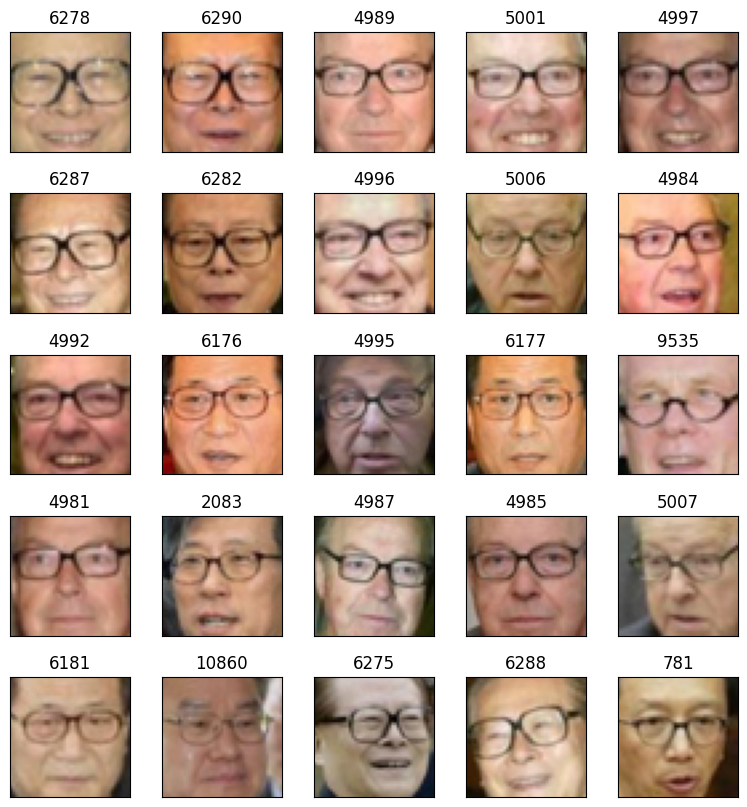

In [22]:
# Display 25 faces with eyeglasses
plot_gallery(
    eyeglasses_data, IMAGE_H, IMAGE_W,
    n_row=5, n_col=5,
    with_title=True, titles=eyeglasses_ids
)


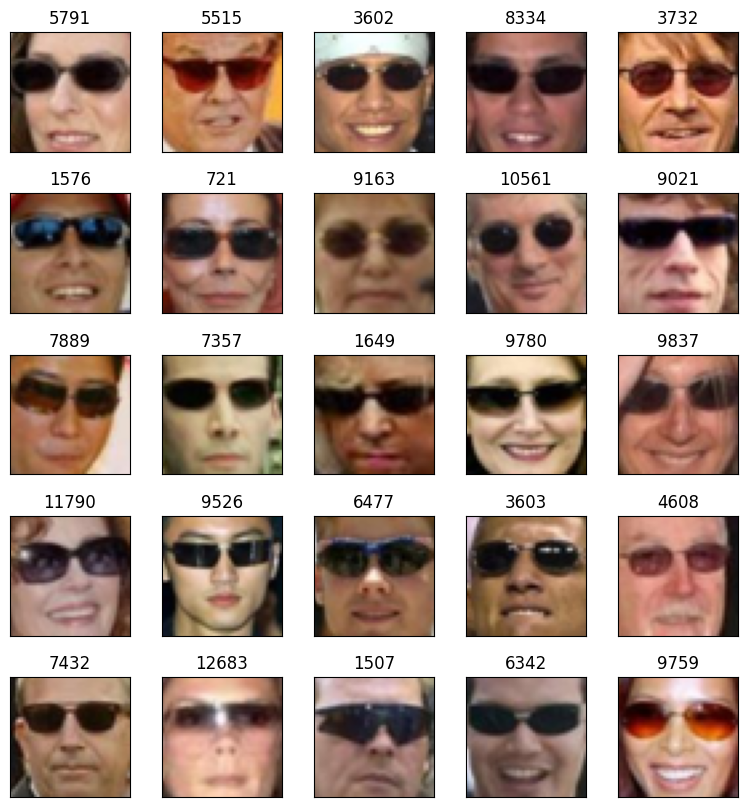

In [23]:

# Display 25 faces with sunglasses
plot_gallery(
    sunglasses_data, IMAGE_H, IMAGE_W,
    n_row=5, n_col=5,
    with_title=True, titles=sunglasses_ids
)

## 16. Encoding and Decoding with the VAE Latent Space

We define helper functions to **move between image space and latent space**:

1. **`to_latent(pic)`**  
   - Encodes an input image into the VAE latent space.
   - Applies the **reparameterization trick** to sample a latent vector `z`.

2. **`from_latent(vec)`**  
   - Decodes a latent vector back into an image.
   - Reshapes the output to `45×45×3`.

These functions are essential for tasks like:
- Generating new images by sampling random `z`.
- Modifying attributes in the latent space (e.g., adding "smile" or "eyeglasses").


In [24]:
def to_latent(pic):
    """
    Encode an input image into the VAE latent space.

    Args:
        pic : Image as a NumPy array or Torch tensor [H, W, C].

    Returns:
        z   : Latent vector sampled using the reparameterization trick.
    """
    with torch.no_grad():
        if isinstance(pic, np.ndarray):
            pic = torch.FloatTensor(pic)

        if len(pic.shape) == 3:
            pic = pic.unsqueeze(0)  # [H, W, C] → [1, H, W, C]

        # Normalize input to [0,1] if not already
        if pic.max() > 1.0:
            pic = pic / 255.0

        # Flatten image for VAE input
        inputs = pic.view(-1, 45 * 45 * 3).to(DEVICE)

        model_vae.eval()
        _, mu, logvar = model_vae(inputs)  # Get distribution parameters
        z = model_vae.reparameterize(mu, logvar)  # Sample latent vector
        return z


def from_latent(vec):
    """
    Decode a latent vector back into an image.

    Args:
        vec : Latent vector (torch tensor).

    Returns:
        out : Decoded image(s) as NumPy array [B, H, W, C].
    """
    with torch.no_grad():
        inputs = vec.to(DEVICE)
        model_vae.eval()
        out = model_vae.decode(inputs)  # Decode latent vector → flattened image
        out = out.cpu().numpy().reshape(-1, 45, 45, 3)  # Reshape to [B, H, W, C]
        return out


## 17. Attribute Manipulation in Latent Space

One of the most powerful capabilities of VAEs is **latent space arithmetic**.

### **Steps**

1. **Compute Mean Latent Representations**
   - Encode groups of images (e.g., smiling, non-smiling, sunglasses).
   - Compute their **mean latent vectors**.

2. **Find Attribute Directions**
   - Subtract mean latent vectors to find the direction of a specific attribute:
     - `smile_vec = smile_latent - no_smile_latent`
     - `sunglasses_vec = sunglasses_latent - smile_latent`

3. **Modify Latent Representations**
   - For a new face:
     - Encode to latent space.
     - Add the attribute direction (`latent_vec += smile_vec`).
     - Decode back to image.

### **Functions**
- **`make_me_smile(ids)`** → Adds a smile to selected faces.
- **`give_me_sunglasses(ids)`** → Adds sunglasses to selected faces.

This demonstrates how **semantic attributes** are encoded linearly in the latent space.


In [25]:
# -------- Compute Average Latent Representations for Attributes --------
# Mean latent vectors for smiling, non-smiling, and sunglasses subsets

smile_latent = to_latent(smile_data).mean(axis=0)
no_smile_latent = to_latent(no_smile_data).mean(axis=0)
sunglasses_latent = to_latent(sunglasses_data).mean(axis=0)

# Attribute direction vectors in latent space
smile_vec = smile_latent - no_smile_latent          # Direction to add a smile
sunglasses_vec = sunglasses_latent - smile_latent   # Direction to add sunglasses


# -------- Functions to Manipulate Latent Attributes --------

def make_me_smile(ids):
    """
    Add a 'smile' to given face images by shifting their latent vectors
    along the smile direction in the latent space.
    """
    for id in ids:
        pic = data[id:id+1]  # Extract the image
        latent_vec = to_latent(pic)
        latent_vec[0] += smile_vec  # Move towards 'smiling' region

        pic_output = from_latent(latent_vec)  # Decode back to image
        plot_gallery([pic, pic_output], IMAGE_H, IMAGE_W, n_row=1, n_col=2)


def give_me_sunglasses(ids):
    """
    Add 'sunglasses' to given face images by shifting their latent vectors
    along the sunglasses direction in the latent space.
    """
    for id in ids:
        pic = data[id:id+1]
        latent_vec = to_latent(pic)
        latent_vec[0] += sunglasses_vec  # Move towards 'sunglasses' region

        pic_output = from_latent(latent_vec)
        plot_gallery([pic, pic_output], IMAGE_H, IMAGE_W, n_row=1, n_col=2)


## 18. Results: Attribute Editing in Generated Faces

We now apply the **attribute manipulation functions** to real images:

1. **`make_me_smile(no_smile_ids)`**  
   - Takes originally non-smiling faces and shifts their latent representation
     towards the "smile" direction in the latent space.

2. **`give_me_sunglasses(smile_ids)`**  
   - Adds sunglasses to smiling faces by moving their latent vectors
     towards the "sunglasses" region.

### **Output**
For each input face:
- Left = Original Image  
- Right = Edited Image (with the added attribute)

This experiment visually confirms that **linear operations in latent space** can meaningfully control high-level semantic attributes.


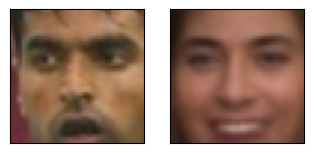

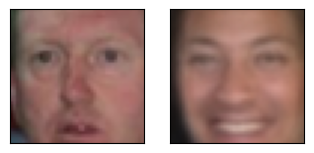

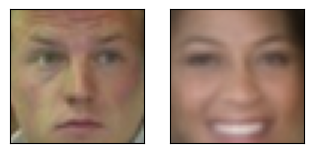

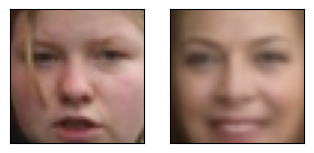

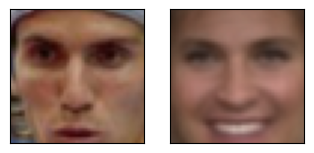

...

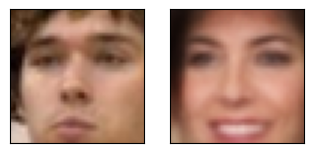

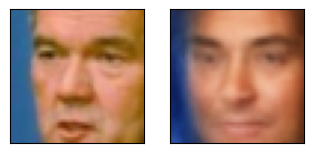

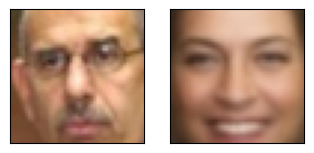

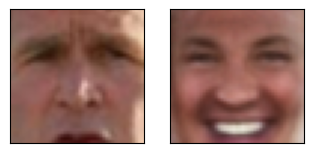

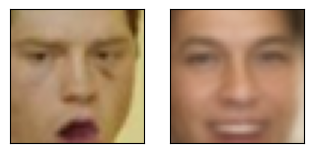

In [26]:
# -------- Apply Latent Space Attribute Manipulation --------

# Turn non-smiling faces into smiling ones
make_me_smile(no_smile_ids)


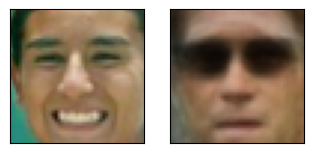

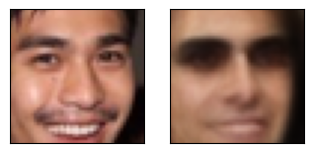

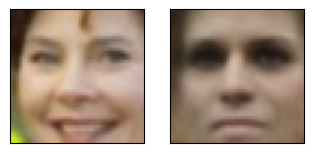

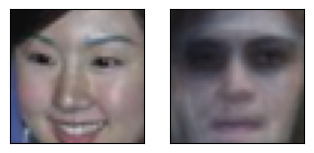

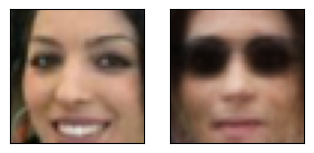

...

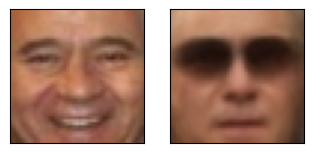

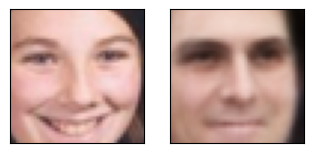

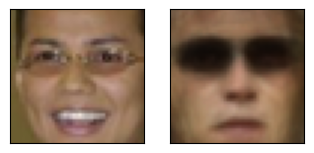

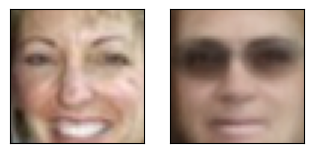

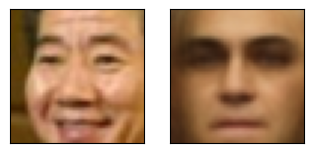

In [27]:

# Add sunglasses to smiling faces
give_me_sunglasses(smile_ids)

## 19. Generating New Random Faces

Finally, we demonstrate the **generative capability** of the trained VAE by sampling random points in the latent space:

### **Steps**
1. **Sample Latent Vectors**
   - Randomly draw `z ~ N(0,1)` (10 latent vectors).

2. **Decode to Image Space**
   - Pass the latent vectors through the VAE decoder to reconstruct new, unseen faces.

3. **Visualization**
   - Display the 10 generated faces in a 2×5 grid.

### **Conclusion**
These results confirm that:
- The VAE successfully learned a **smooth latent representation** of the face distribution.
- New, **diverse yet thematically consistent** faces can be synthesized from random latent samples.


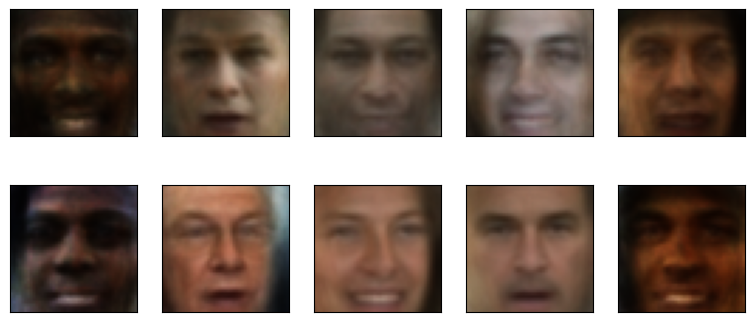

In [28]:
# -------- Generate 10 Random Faces Using the VAE --------

# Sample 10 random latent vectors from standard normal distribution (z ~ N(0,1))
z_random = np.random.randn(10, dim_z)
z_random = torch.FloatTensor(z_random).to(DEVICE)

# Decode latent vectors to images
with torch.no_grad():
    generated_imgs = model_vae.decode(z_random)
    generated_imgs = generated_imgs.cpu().numpy().reshape(-1, 45, 45, 3)

# Display the generated images in a 2x5 grid
plot_gallery(generated_imgs, IMAGE_H, IMAGE_W, n_row=2, n_col=5)
